# 0. Import libraries

In [1]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

In [2]:
import celloracle as co
co.check_python_requirements()
co.__version__

'0.10.12'

In [3]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

## 0.2. Make a folder to save graph

In [4]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)

# 1. Load data
## 1.1. Load processed gene expression data (anndata)


In [5]:
adata = sc.read_h5ad("myeloid_RNA.h5ad")

In [6]:
adata

AnnData object with n_obs × n_vars = 8729 × 31053
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'condition', 'percent.mt', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.3', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell.type', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5', 'active_ident'
    uns: 'RNA_snn_res.0.5_colors', 'active_ident_colors', 'seurat_clusters_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'raw_count'

In [60]:
di = {"Donor": "Donor", "NRpre": "preLVAD HF", "Rpre":"preLVAD HF", "NRpost":"NRpost",
      "Rpost":"Rpost"}
adata.obs = adata.obs.replace({"condition": di})

In [7]:
adata.obs["condition"].value_counts()

TAC                   3063
Sham                  2118
TAC + JAQwithdrawn    1928
TAC + JAQ             1620
Name: condition, dtype: int64

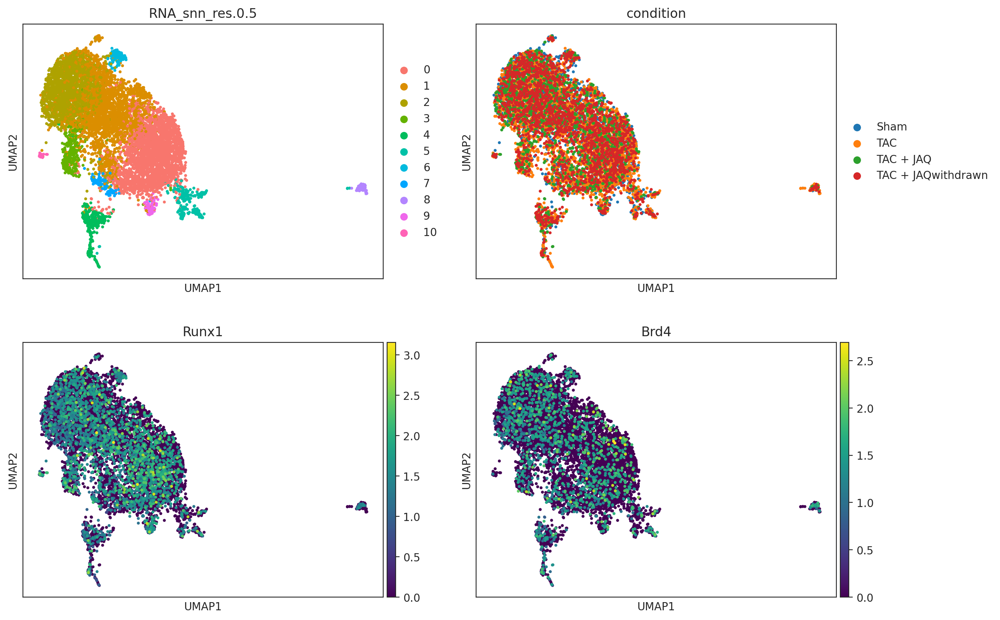

In [8]:
sc.pl.umap(adata, color=["RNA_snn_res.0.5",'condition', 'Runx1', 'Brd4'], s=30, cmap="viridis", ncols=2)

In [9]:
adata.obs["condition_and_celltype"] = adata.obs["condition"].astype("str") + "_" + adata.obs['cell.type'].astype("str") 

In [10]:
sc.tl.embedding_density(adata, basis='umap', groupby='condition')

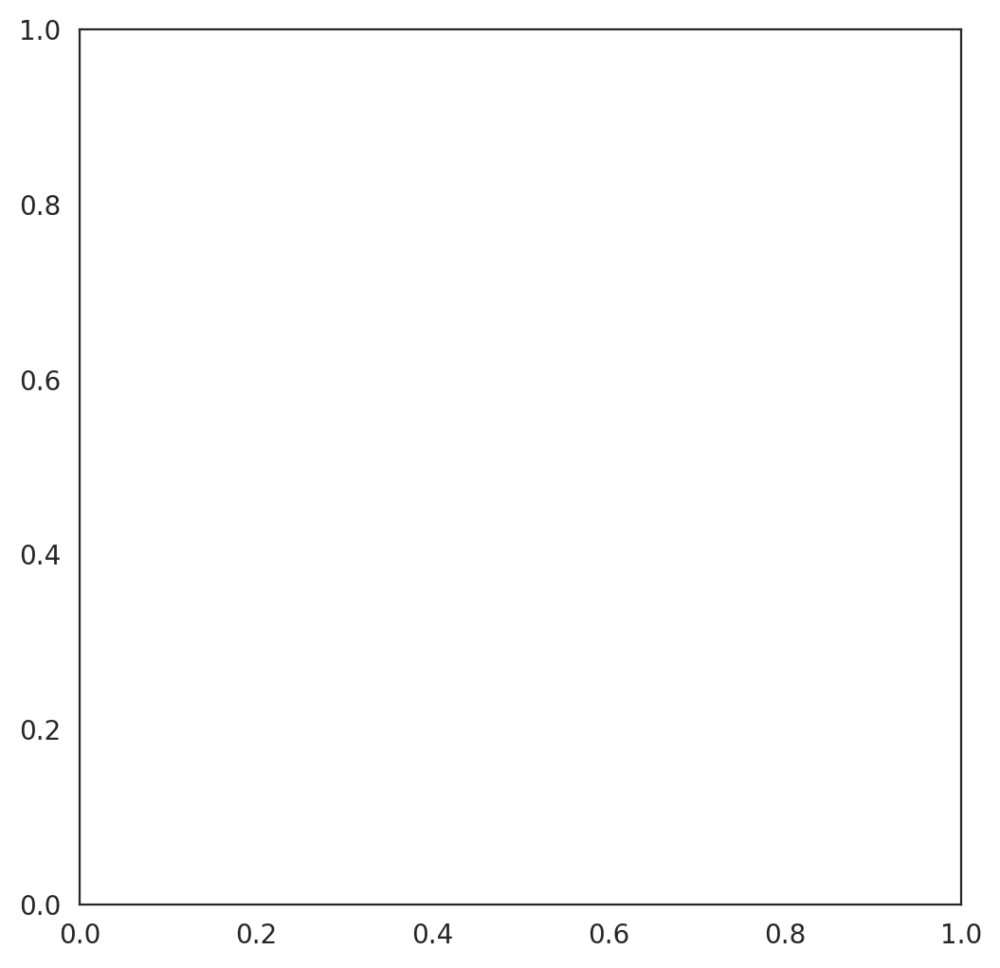

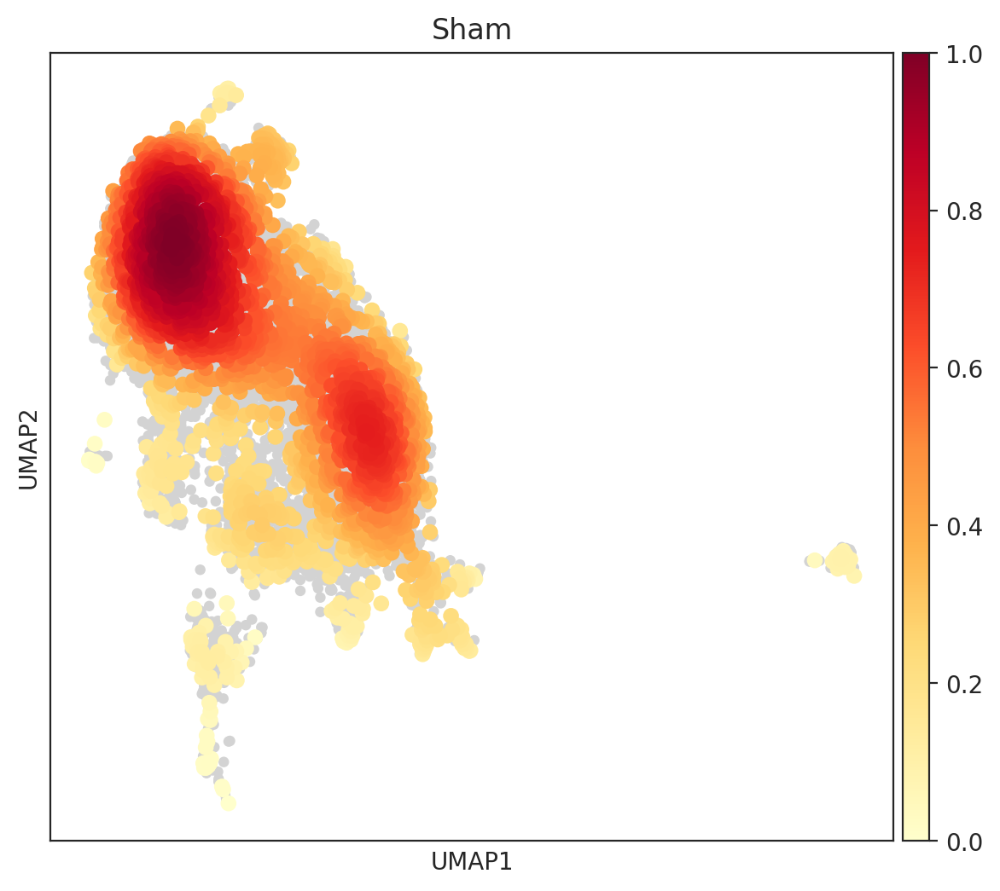

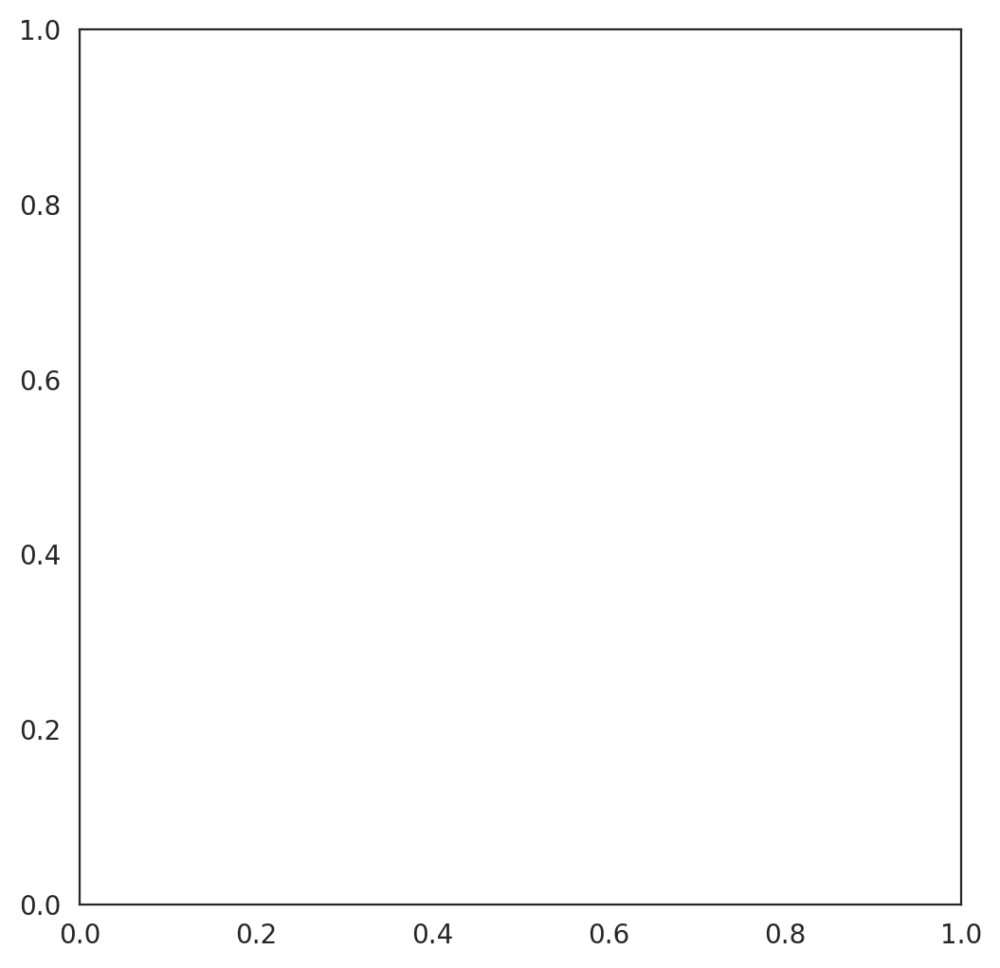

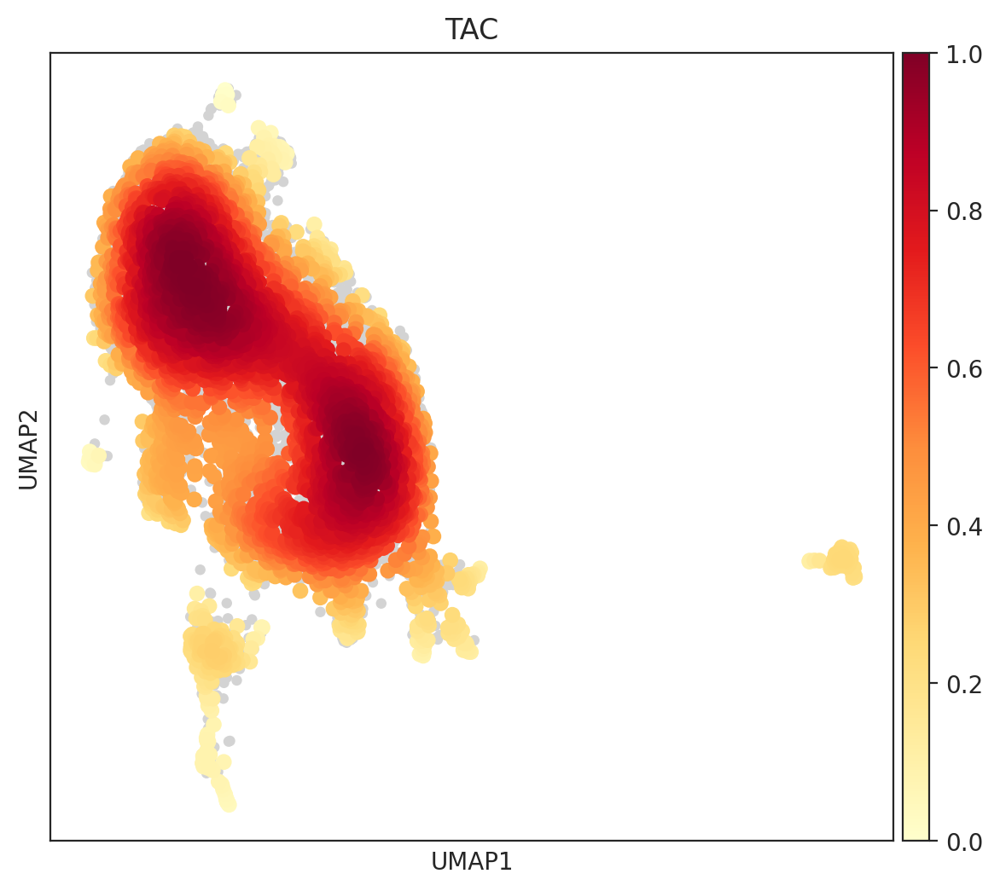

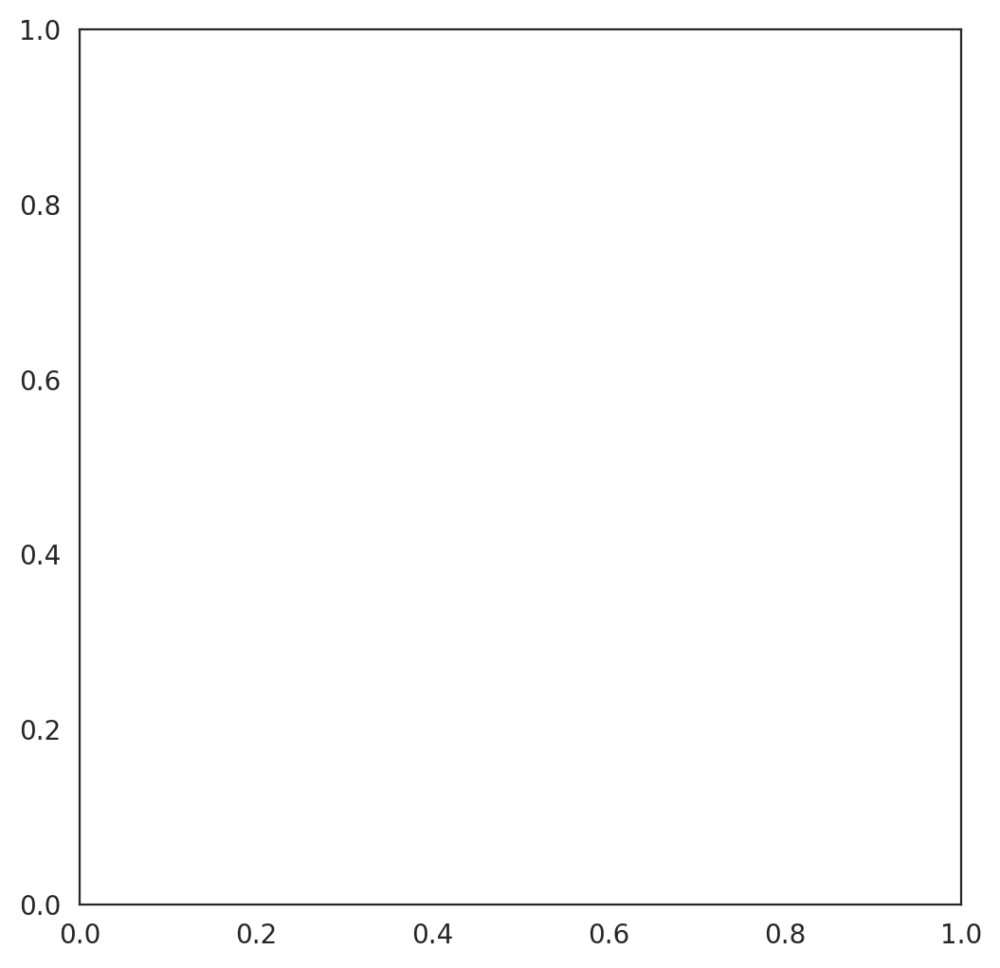

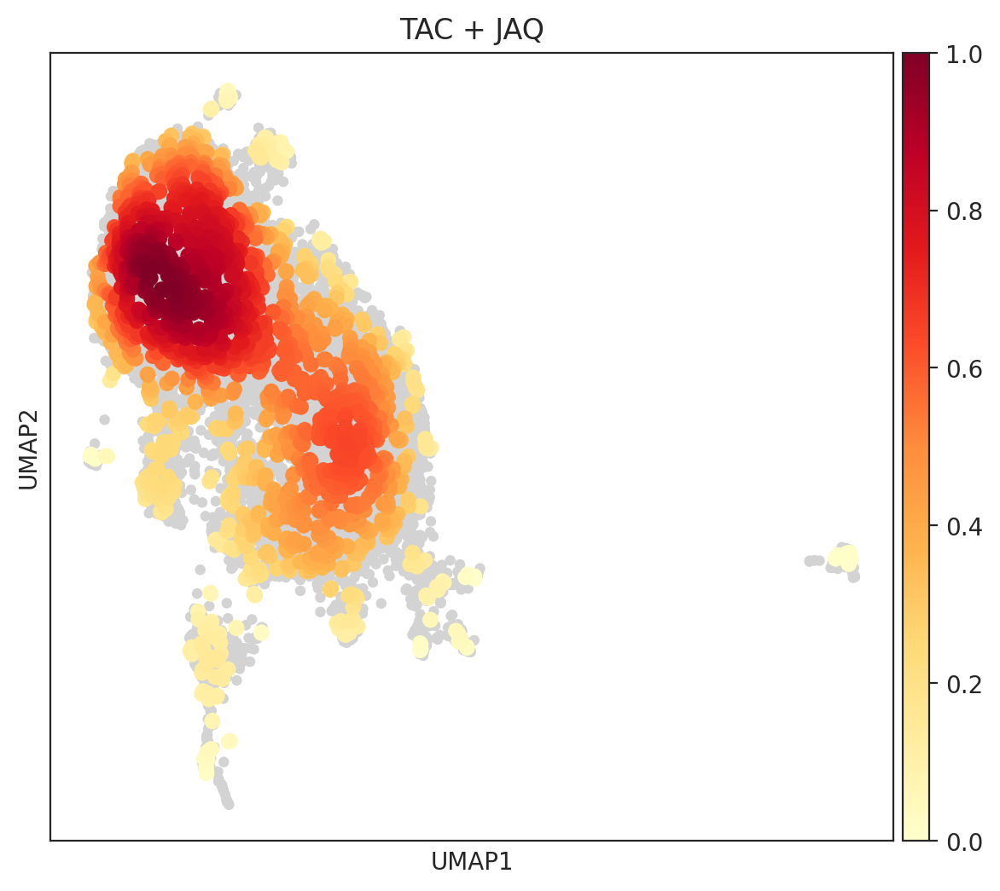

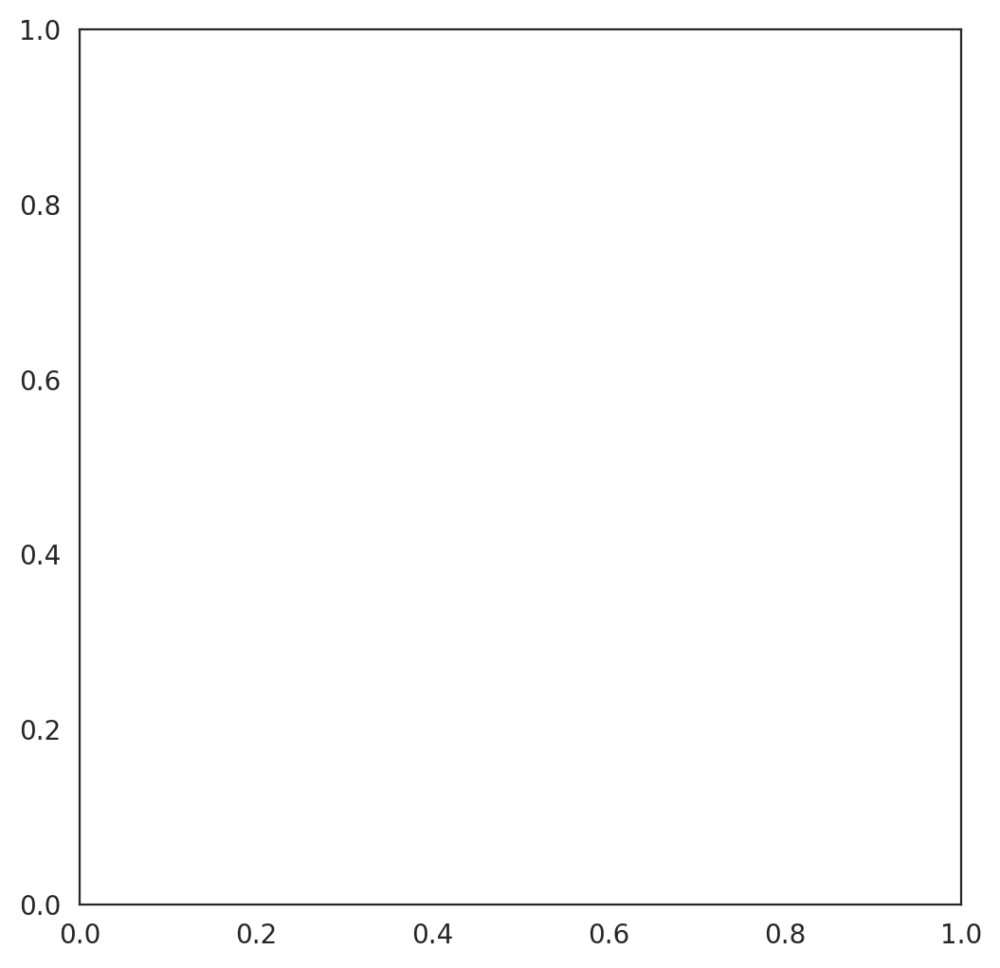

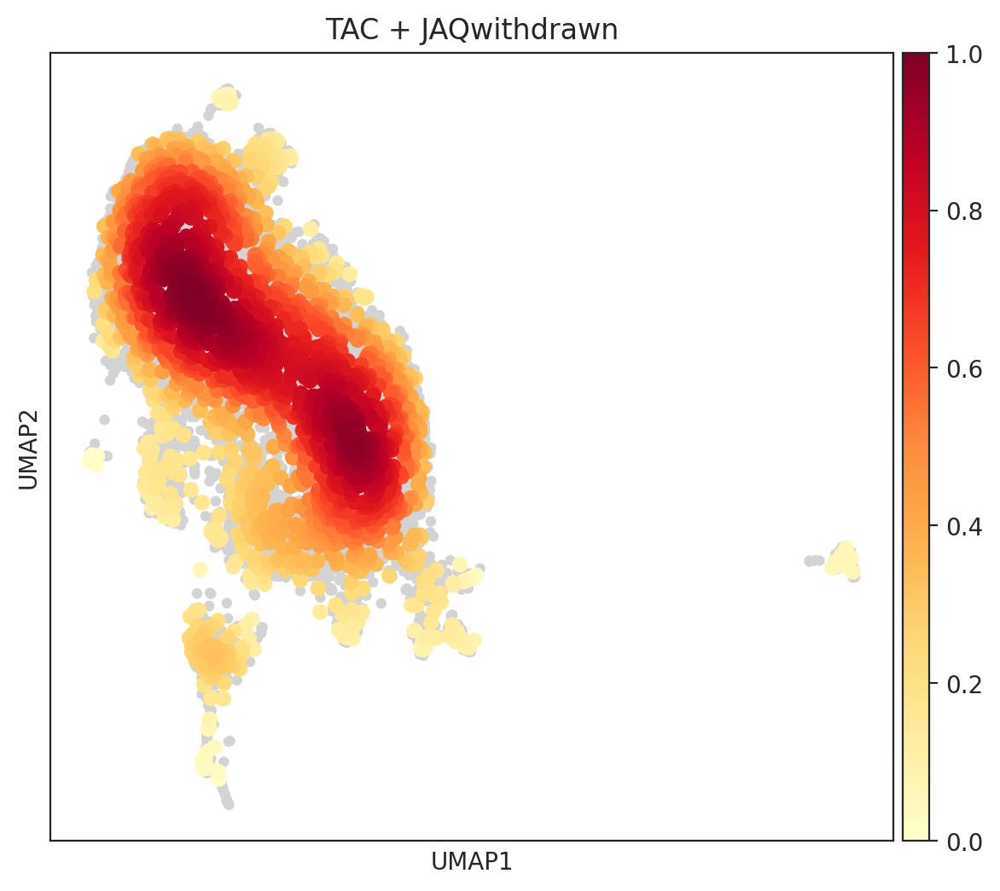

In [45]:
for i in adata.obs.condition.unique():
    fig, ax = plt.subplots(figsize=[6, 6])
    sc.pl.embedding_density(
        adata, basis='umap', key='umap_density_condition', group=i
    )

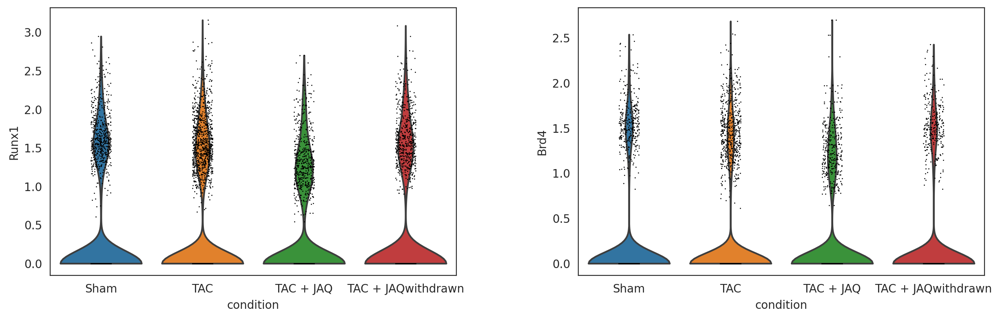

In [12]:
sc.pl.violin(adata, keys=[ "Runx1", "Brd4"], groupby="condition")

## 1.2. (Optional step) Downsampling

If your scRNA-seq data includes more than 20-30K cells, we recommend downsampling your data. If you do not, please note the perturbation simulations may require large amounts of memory in the next notebook. 

Also, please pay attention to the number of genes. If you are following the instruction from the previous tutorial notebook, the scRNA-seq data should include only top 2~3K variable genes. If you have more than 3K genes, it may cause issues downstream.

In [13]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :8729
Gene number is :31053


In [14]:
# Random downsampling into 20K cells if the anndata object include more than 20 K cells.
n_cells_downsample = 20000 
if adata.shape[0] > n_cells_downsample:
    # Let's dowmsample into 30K cells
    sc.pp.subsample(adata, n_obs=n_cells_downsample, random_state=123)

In [15]:
print(f"Cell number is :{adata.shape[0]}")

Cell number is :8729


In [16]:
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='seurat')

In [19]:
var_gene = adata.var.index[adata.var.highly_variable].values

In [20]:
adata = adata[:, var_gene]

In [21]:
adata.X

<8729x3000 sparse matrix of type '<class 'numpy.float32'>'
	with 1534130 stored elements in Compressed Sparse Row format>

## 1.2. Load base-GRN data. 
To infer cluster-specific GRNs, CellOracle requires a base GRN. 
- There are several ways to make a base GRN. We can typically generate base GRN from scATAC-seq data or bulk ATAC-seq data. Please refer to the first step of the tutorial to learn more about this process. https://morris-lab.github.io/CellOracle.documentation/tutorials/base_grn.html


- If you do not have your scATAC-seq data, you can use one of the built-in base GRNs options below. 

- Base GRNs made from mouse sci-ATAC-seq atlas : The built-in base GRN was made from various tissue/cell-types found in the atlas (http://atlas.gs.washington.edu/mouse-atac/). We recommend using this for mouse scRNA-seq data. Please load this data as follows.

 `base_GRN = co.data.load_mouse_scATAC_atlas_base_GRN()`


- Promoter base GRN: We also provide base GRN made from promoter DNA-sequences for ten species. You can load this data as follows.

 - e.g. for Human: `base_GRN = co.data.load_human_promoter_base_GRN()`



In [22]:
# Load TF info which was made from mouse cell atlas dataset.
base_GRN = co.data.load_mouse_scATAC_atlas_base_GRN()

# Check data
base_GRN.head()

,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_100050979_100052296,4930430F08Rik,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101006922_101007748,SNORA17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,chr10_101144061_101145000,Mgat4c,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,chr10_10148873_10149183,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_10149425_10149815,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 2. Make Oracle object

We will use an Oracle object during the data preprocessing and GRN inference steps. Using its internal functions, the Oracle object computes and stores all of the necessary information for these calculations. To begin, we will instantiate a new Oracle object and input our gene expression data (anndata) and TF info (base GRN).

In [23]:
# Instantiate Oracle object
oracle = co.Oracle()

## 2.1. load gene expression data into oracle object.

For the CellOracle analysis, your anndata should include (1) gene expression counts, (2) clustering information, and (3) trajectory (dimensional reduction embedding) data. Please refer to a previous notebook for more information on anndata preprocessing.


When you load the scRNA-seq data, please enter **the name of the clustering data** and **the name of the dimensionality reduction.**
 - The clustering data should be to be stored in the `obs` the attribute of anndata. 
  > You can check it using the following command.
  >
  > `adata.obs.columns`
  
 - Dimensional reduction data is stored in the `obsm` the attribute of anndata. 
  > You can check it with the following command.
  > 
  > `adata.obsm.keys()`
  


In [24]:
# Check data in anndata
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

Metadata columns : ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'condition', 'percent.mt', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.3', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell.type', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'RNA_snn_res.0.5', 'active_ident', 'condition_and_celltype', 'umap_density_condition']
Dimensional reduction:  ['X_harmony', 'X_pca', 'X_umap']


In [25]:
# In this notebook, we use the unscaled mRNA count for the nput of Oracle object.
adata.X = adata.layers["raw_count"].copy()
sc.pp.normalize_per_cell(adata)

In [26]:
# Instantiate Oracle object.
cluster_column_name = 'RNA_snn_res.0.5'
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name=cluster_column_name,
                                   embedding_name="X_umap")

## 2.2. Load base-GRN data into oracle object

In [27]:
# You can load TF info dataframe with the following code.
oracle.import_TF_data(TF_info_matrix=base_GRN)

# Alternatively, if you saved the informmation as a dictionary, you can use the code below.
# oracle.import_TF_data(TFdict=TFinfo_dictionary)

In [28]:
oracle.adata.var

,highly_variable,means,dispersions,dispersions_norm,symbol,isin_top1000_var_mean_genes,isin_TFdict_targets,isin_TFdict_regulators
Sox17,True,0.016118,1.451392,0.734184,Sox17,False,True,True
Alkal1,True,0.000494,1.461018,0.772649,Alkal1,False,False,False
Prex2,True,0.013047,1.460703,0.771390,Prex2,True,True,False
Sulf1,True,0.011826,1.354675,0.347678,Sulf1,False,True,False
Slco5a1,True,0.001108,1.405716,0.551650,Slco5a1,True,True,False
...,...,...,...,...,...,...,...,...
B230217O12Rik,True,0.002013,1.390237,0.489794,B230217O12Rik,False,True,False
Nanos1,True,0.035324,1.566556,1.194403,Nanos1,True,True,False
mt-Nd2,True,2.777560,1.925089,0.431720,mt-Nd2,False,False,False
mt-Nd4l,True,1.088591,1.556952,0.668599,mt-Nd4l,False,False,False


In [29]:
oracle.adata.var.loc["Runx1"]

highly_variable                    True
means                          0.808787
dispersions                    1.457062
dispersions_norm               0.580605
symbol                            Runx1
isin_top1000_var_mean_genes       False
isin_TFdict_targets                True
isin_TFdict_regulators             True
Name: Runx1, dtype: object

# 3. KNN imputation
CellOracle uses the same strategy as velocyto for visualizing cell transitions. This process requires KNN imputation in advance.

For the KNN imputation, we first need to calculate and select PCs.

## 3.1. PCA

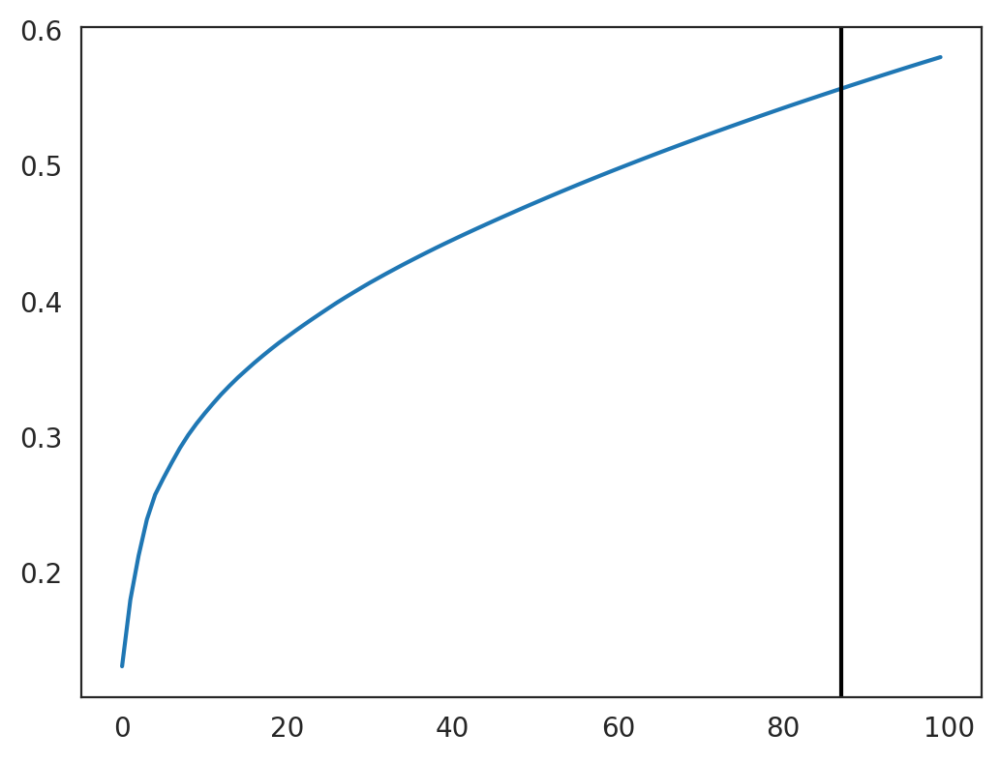

87


In [30]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

## 3.2. KNN imputation

Estimate the optimal number of nearest neighbors for KNN imputation.

In [31]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :8729


In [32]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :218


In [33]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

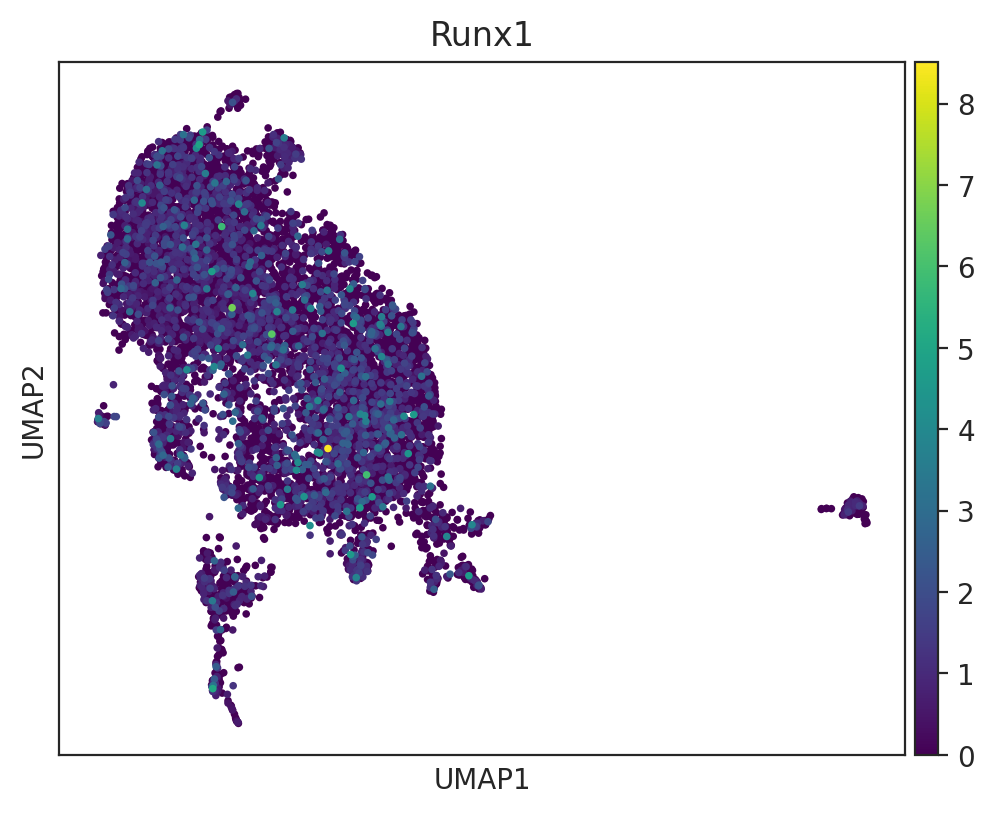

In [34]:
sc.pl.umap(oracle.adata, layer="raw_count",
           color=["Runx1"], s=30, cmap="viridis")

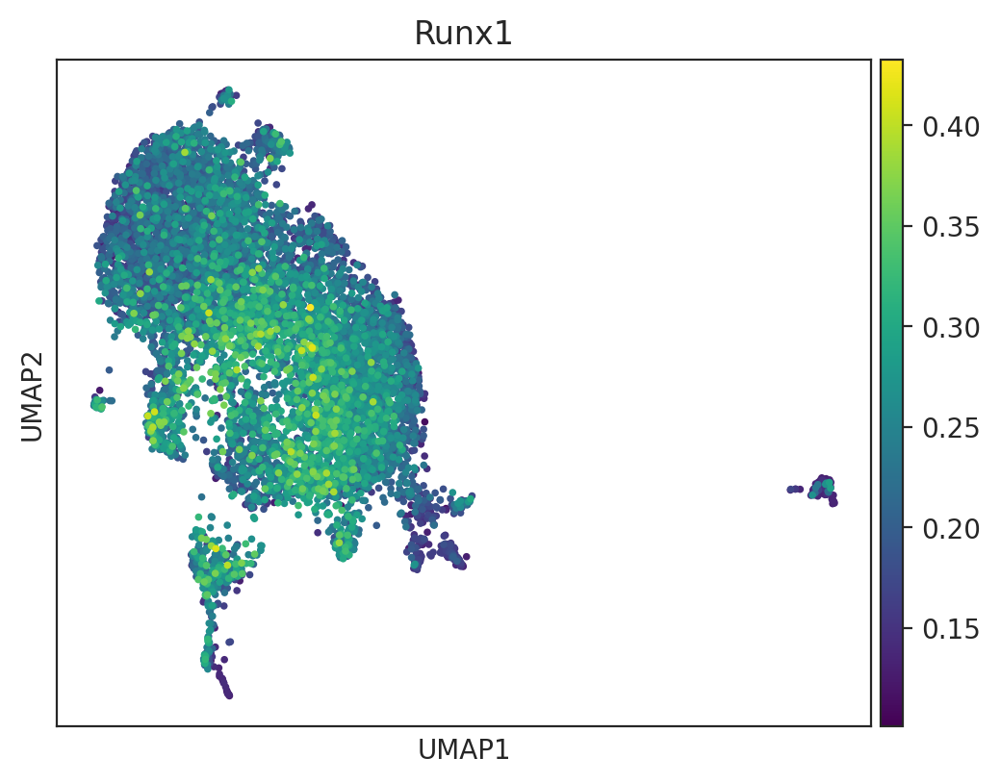

In [35]:
sc.pl.umap(oracle.adata, layer="imputed_count",
           color=["Runx1"], s=30, cmap="viridis")

# 4. Save and Load.

You can save your `Oracle` object using `Oracle.to_hdf5(FILE_NAME.celloracle.oracle)`. 

Pleasae use `co.load_hdf5(FILE_NAME.celloracle.oracle)` to load the saved file.


In [36]:
# Save oracle object.
oracle.to_hdf5("Myeloid.celloracle.oracle")

# 5. GRN calculation
The next step constructs a cluster-specific GRN for all clusters.

- You can calculate GRNs with the `get_links` function, and it will return the results as a `Links` object.
The `Links` object stores the inferred GRNs and the corresponding metadata. Most network structure analysis is performed with the `Links` object.

- A GRN will be calculated for each cluster/sub-group. In the example below, we construct GRN for each unit of the "louvain_annot" clustering.



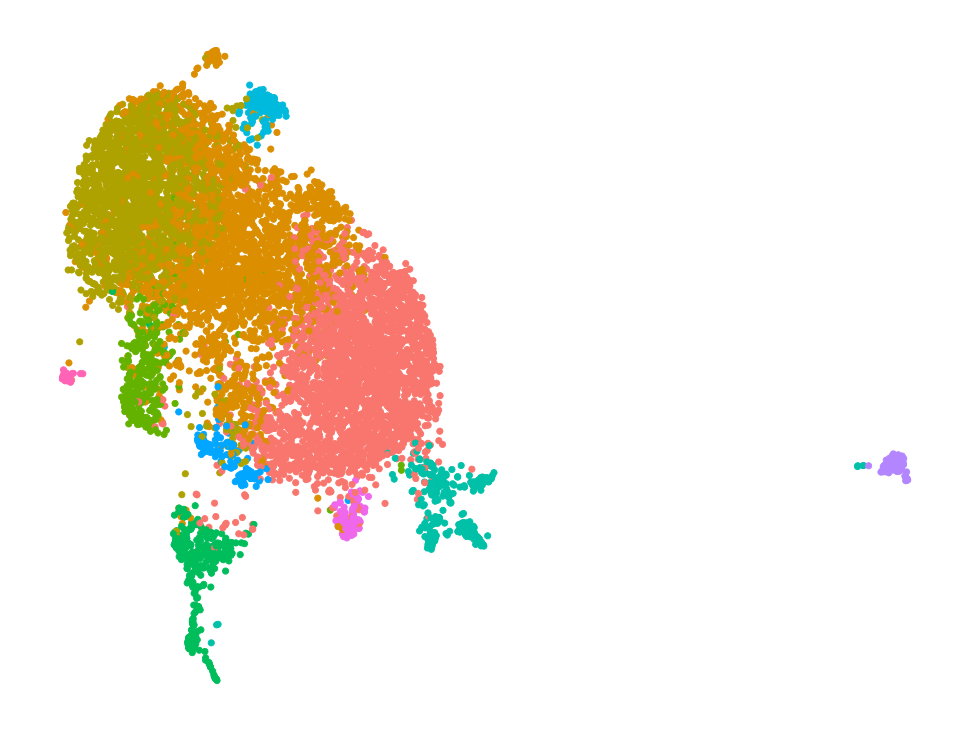

In [37]:
oracle.plot_cluster_whole()

## 5.1. Get GRNs

In [38]:
%%time
# Calculate GRN for each population in "louvain_annot" clustering unit.
# This step may take some time.(~30 minutes)

unit = cluster_column_name
links = oracle.get_links(cluster_name_for_GRN_unit=unit, alpha=10, verbose_level=10)
# Calculate network scores. 
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)
links.get_network_score()

# Save Links object.
links.to_hdf5(file_path=f"links_myeloid_{unit}.celloracle.links")

  0%|          | 0/11 [00:00<?, ?it/s]

Inferring GRN for 0...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 1...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 10...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 2...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 3...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 4...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 5...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 6...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 7...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 8...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for 9...


  0%|          | 0/2259 [00:00<?, ?it/s]

CPU times: user 13min 59s, sys: 1min, total: 15min
Wall time: 15min 46s


In [39]:
%%time
# Calculate GRN for each population in "louvain_annot" clustering unit.
# This step may take some time.(~30 minutes)

unit = "condition"
links = oracle.get_links(cluster_name_for_GRN_unit=unit, alpha=10, verbose_level=10)
# Calculate network scores. 
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)
links.get_network_score()
# Save Links object.
links.to_hdf5(file_path=f"links_myeloid_{unit}.celloracle.links")

  0%|          | 0/4 [00:00<?, ?it/s]

Inferring GRN for Sham...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for TAC...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for TAC + JAQ...


  0%|          | 0/2259 [00:00<?, ?it/s]

Inferring GRN for TAC + JAQwithdrawn...


  0%|          | 0/2259 [00:00<?, ?it/s]

CPU times: user 5min 34s, sys: 35.9 s, total: 6min 10s
Wall time: 6min 57s


## 6.4. Save

Save processed GRNs. We will use this file during the in in silico TF perturbation analysis.

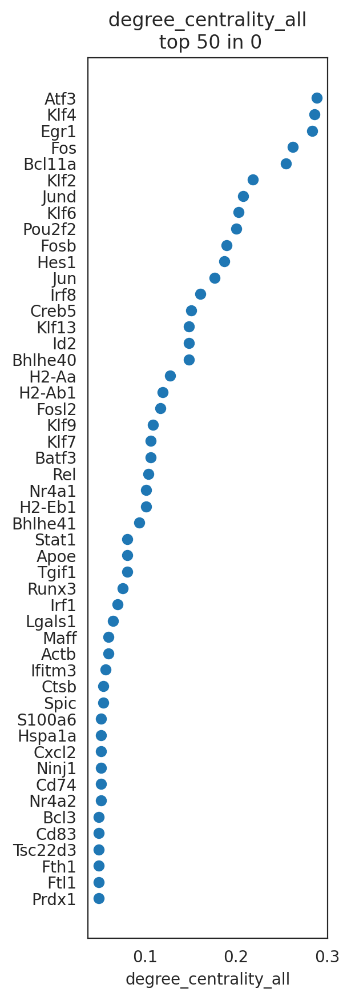

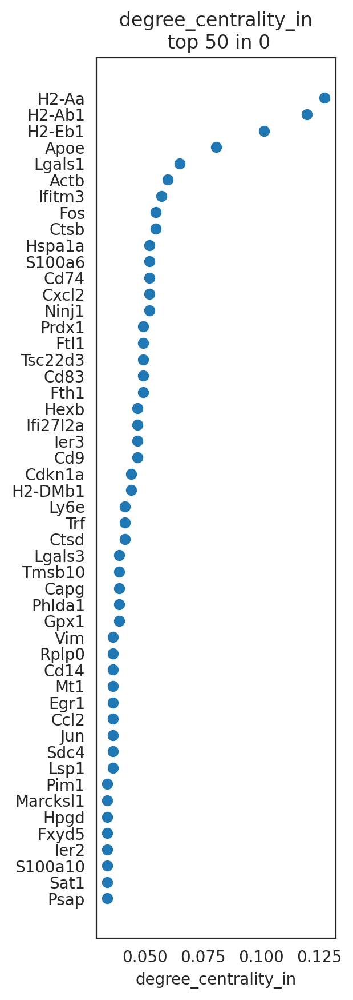

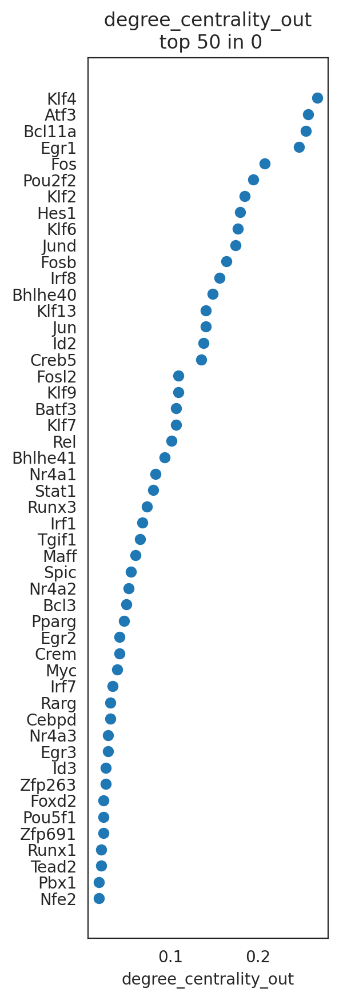

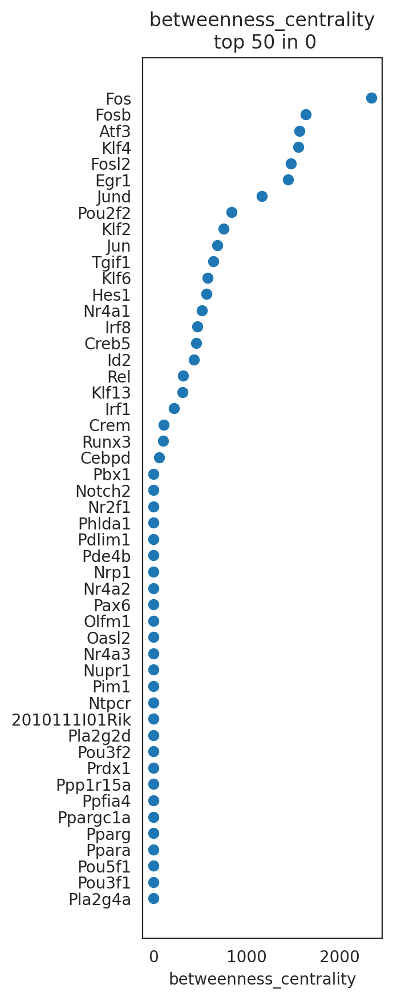

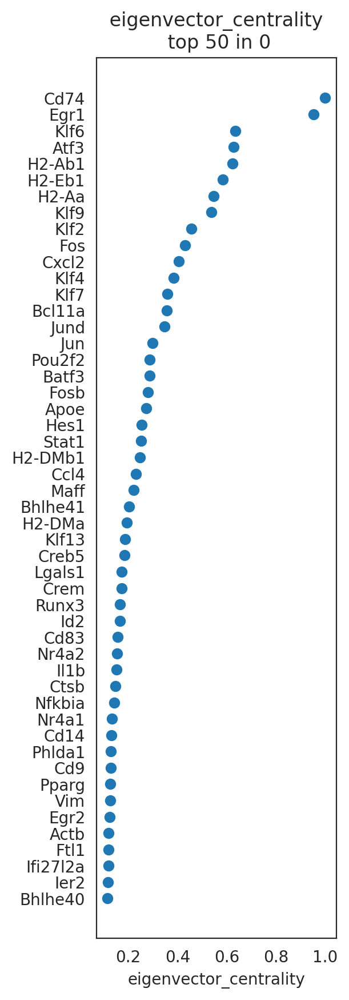

...

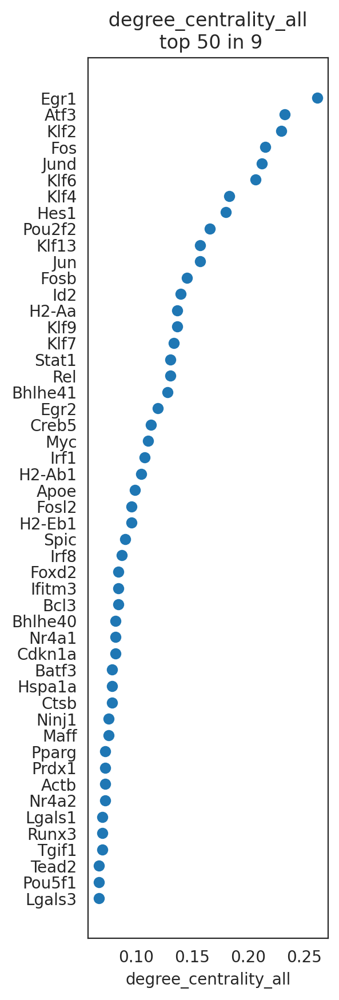

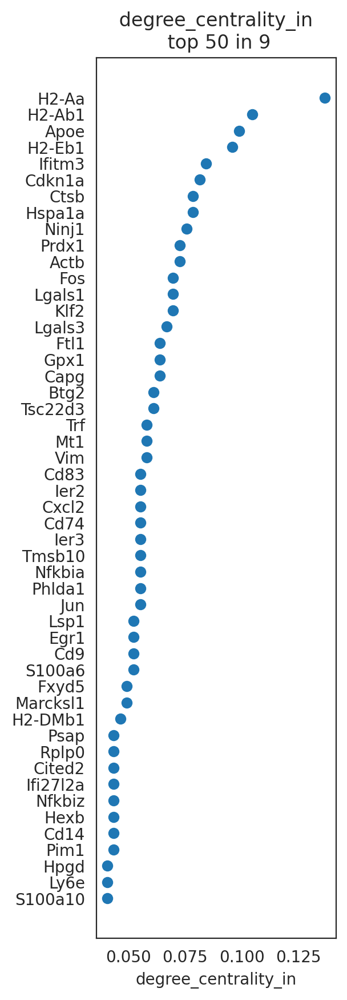

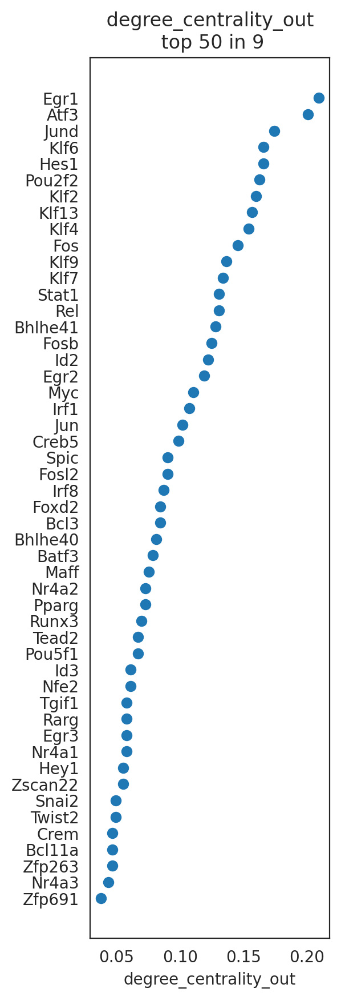

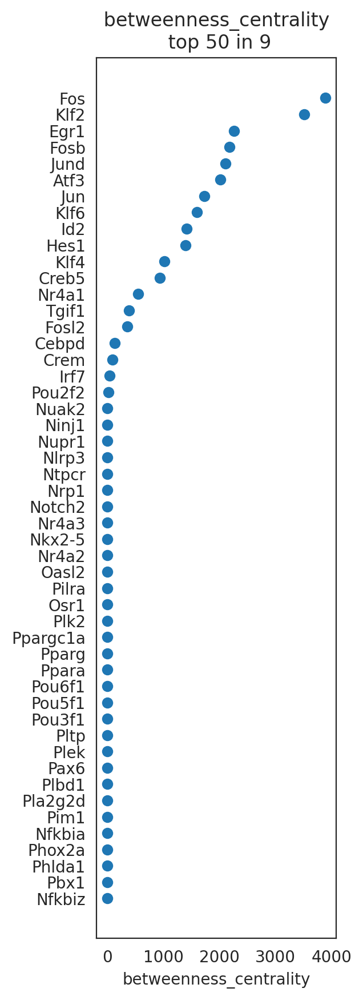

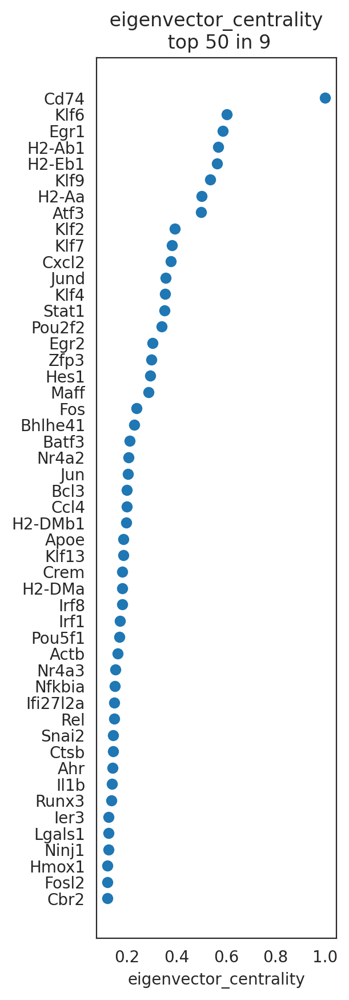

Runx1


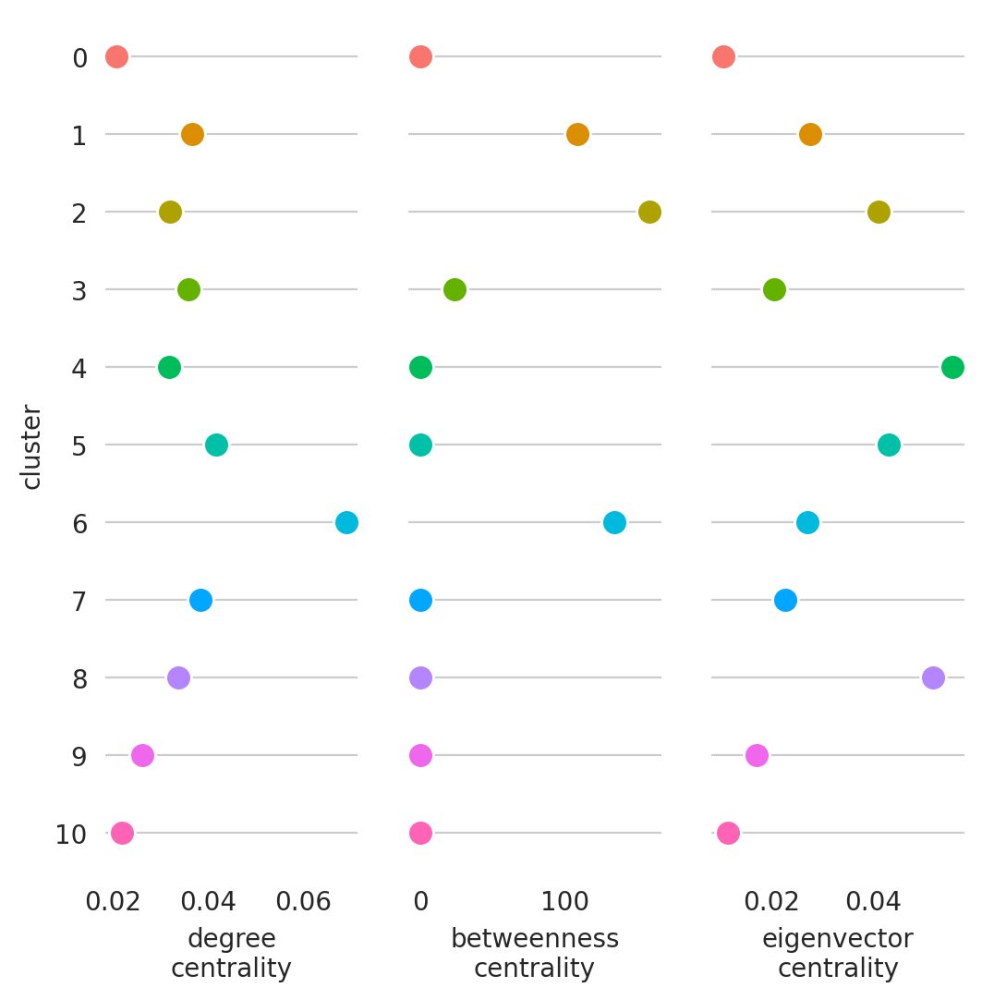

In [40]:
save_folder = "Myeloid_GRN_per_celltype"
os.makedirs(save_folder, exist_ok=True)


links = co.load_hdf5("links_myeloid_RNA_snn_res.0.5.celloracle.links")
links.merged_score.to_csv(f"{save_folder}/scores.csv")

plt.rcParams["figure.figsize"] = [6, 10]

for i in links.cluster:
    # Visualize top n-th genes with high scores.
    links.plot_scores_as_rank(cluster=i, n_gene=50, save=f"{save_folder}/ranked_score")
    
    
plt.rcParams["figure.figsize"] = [6, 6]
# Visualize Gata2 network score dynamics
links.plot_score_per_cluster(goi="Runx1", save=f"{save_folder}/network_score_per_gene/")

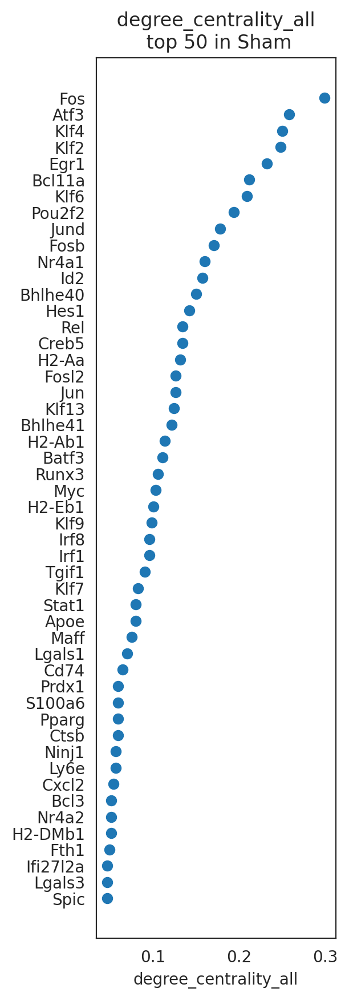

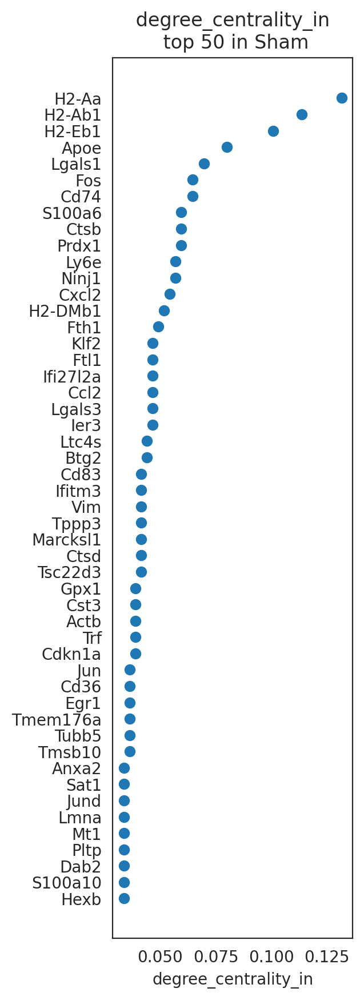

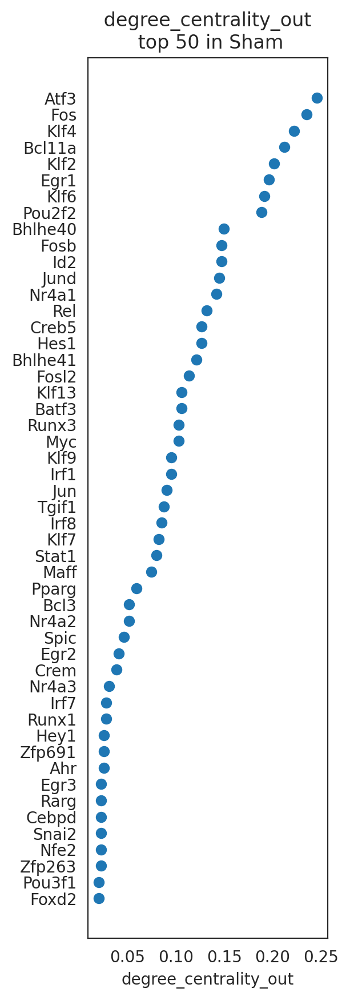

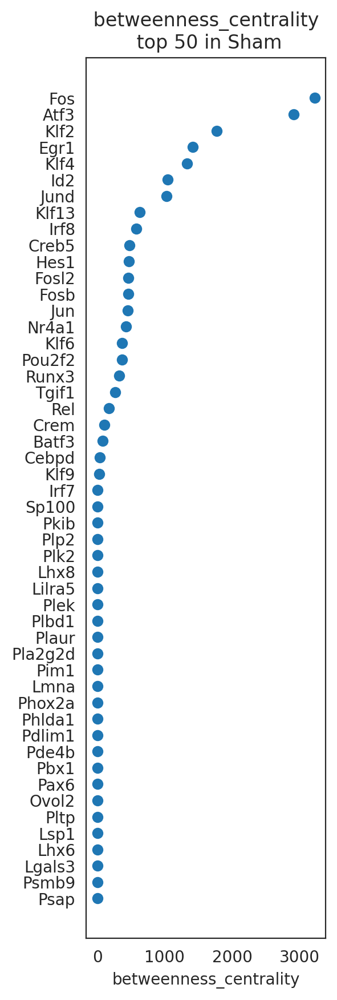

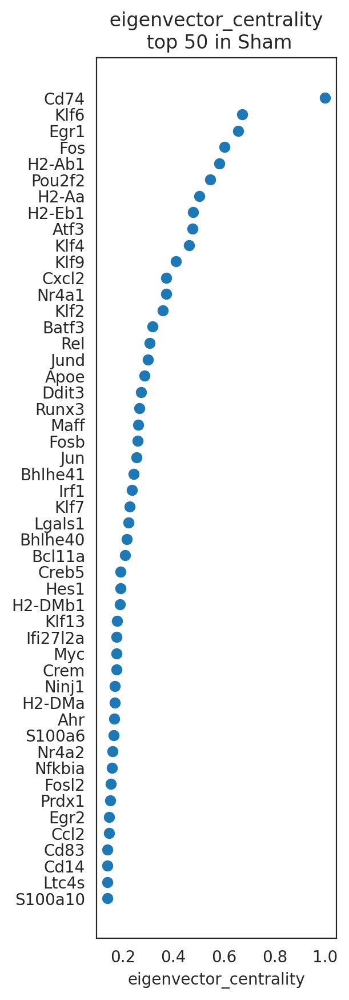

...

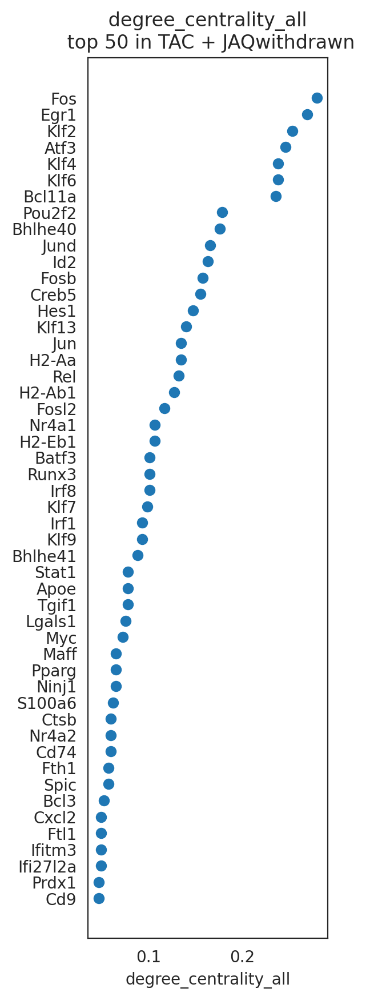

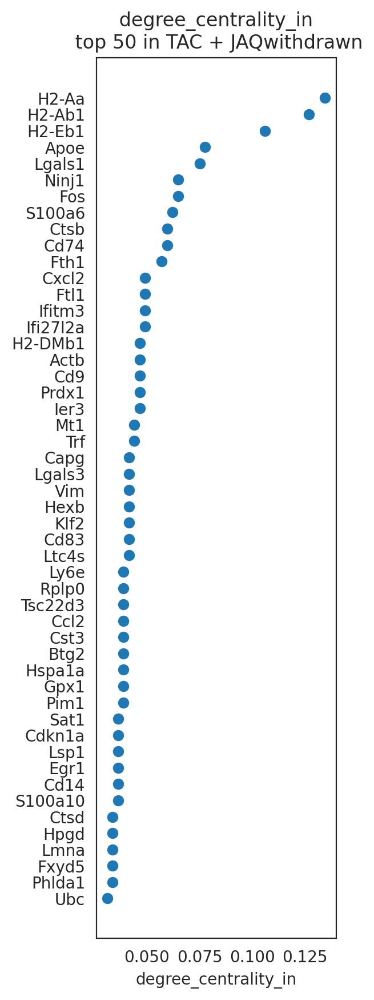

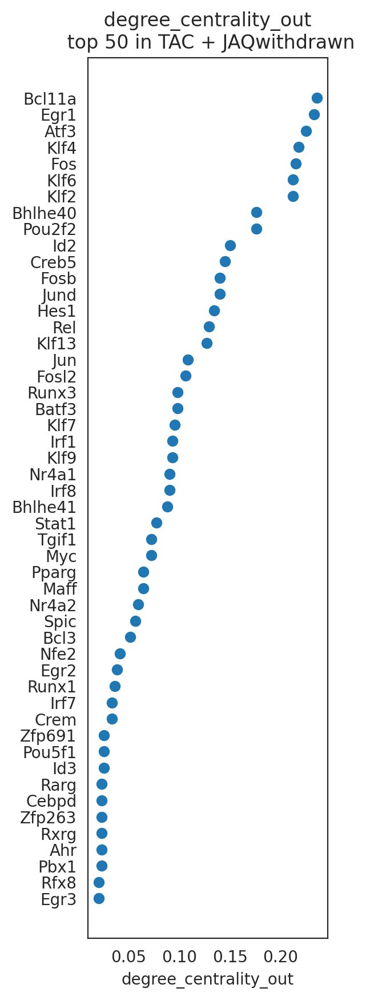

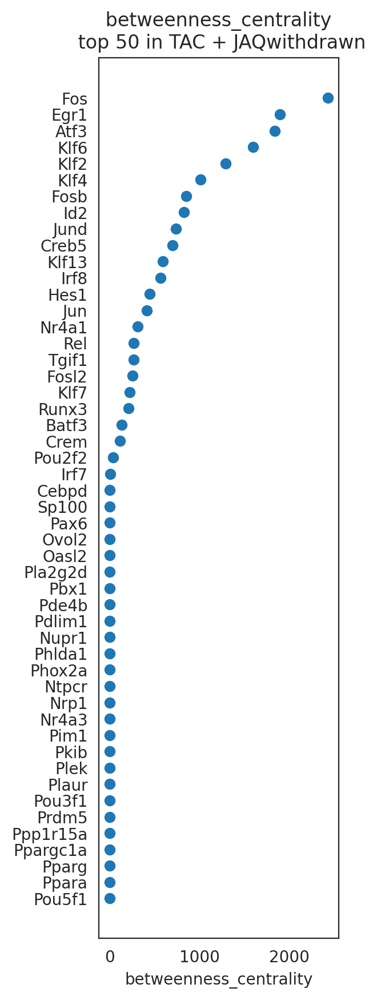

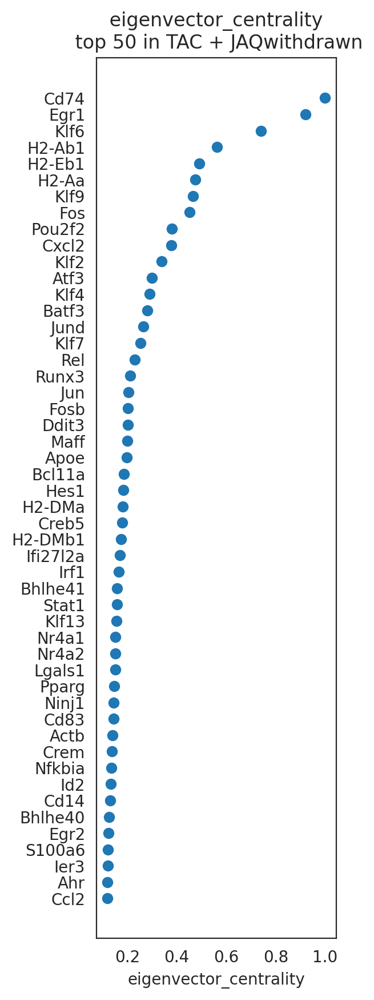

Runx1


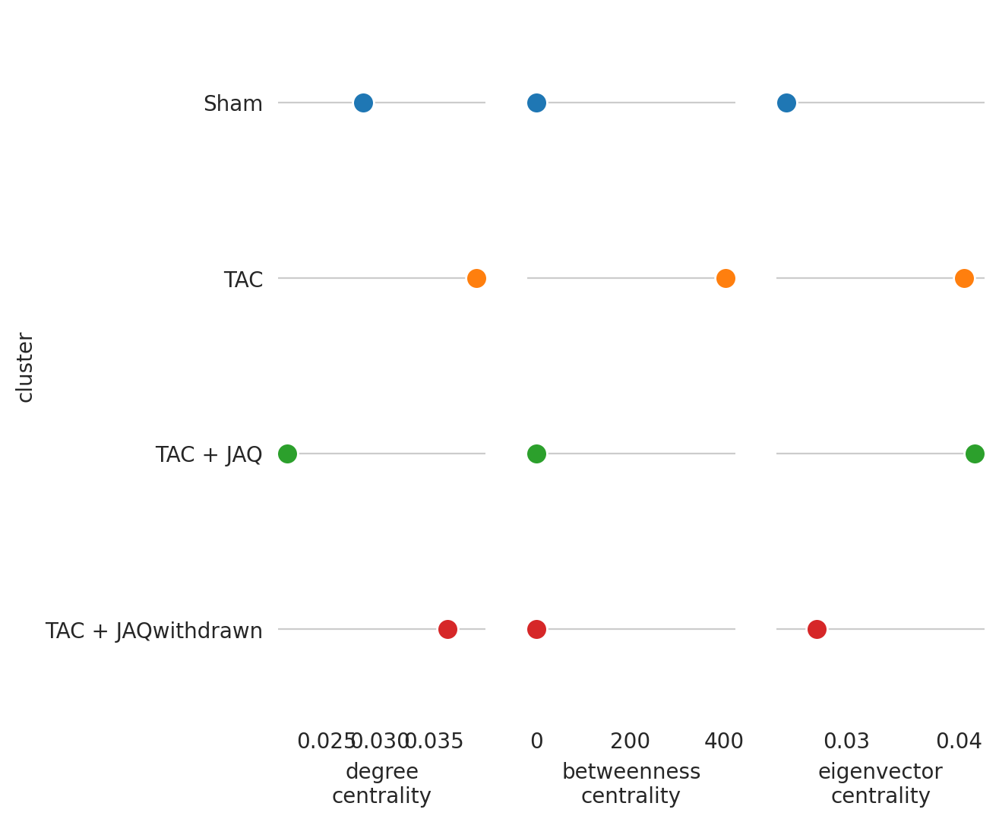

In [41]:

save_folder = "Myeloid_GRN_per_condition"
os.makedirs(save_folder, exist_ok=True)


links = co.load_hdf5("links_myeloid_condition.celloracle.links")
links.merged_score.to_csv(f"{save_folder}/scores.csv")

plt.rcParams["figure.figsize"] = [6, 10]

for i in links.cluster:
    # Visualize top n-th genes with high scores.
    links.plot_scores_as_rank(cluster=i, n_gene=50, save=f"{save_folder}/ranked_score")
    
    
plt.rcParams["figure.figsize"] = [6, 6]
# Visualize Gata2 network score dynamics
links.plot_score_per_cluster(goi="Runx1", save=f"{save_folder}/network_score_per_gene/")

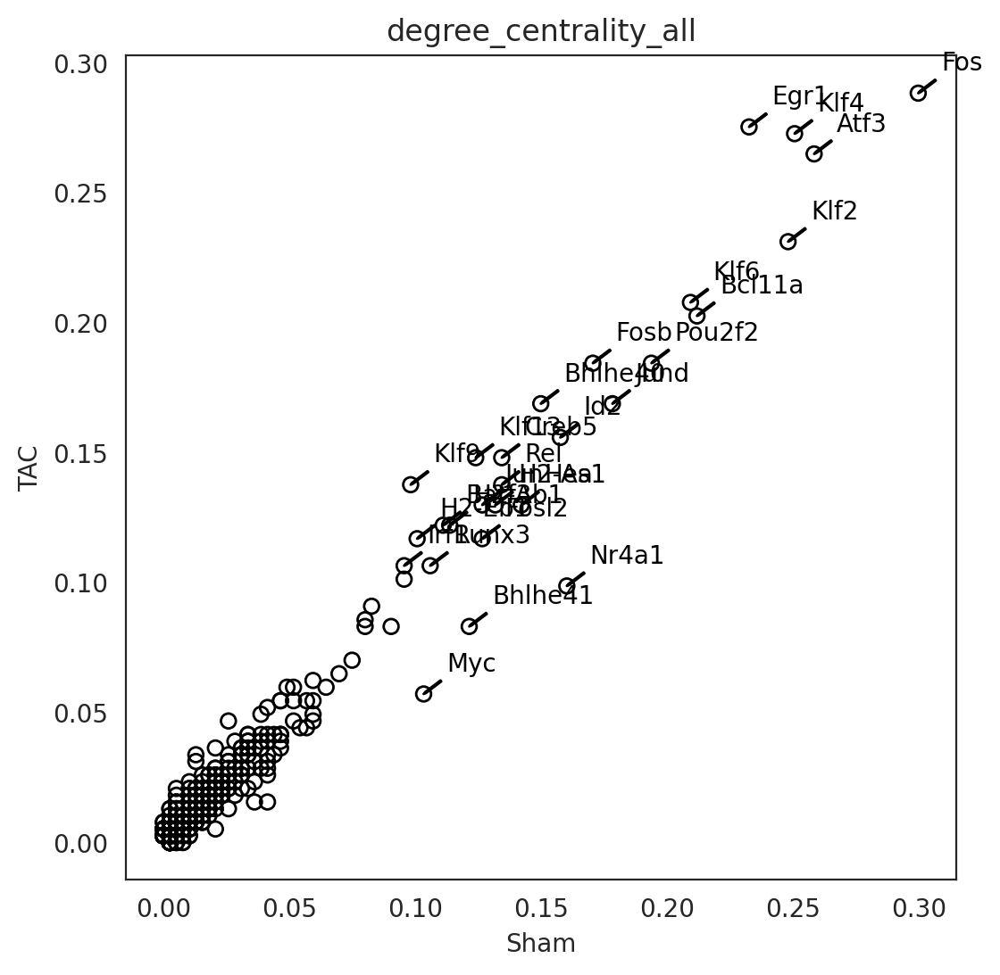

In [43]:
links.plot_score_comparison_2D("degree_centrality_all", 
                               cluster1='Sham',
                               cluster2="TAC",
                               percentile=94, 
                               save=f"{save_folder}/network_score_comparison/"
                               )

In [140]:
# links.plot_score_comparison_2D("degree_centrality_all", 
#                                cluster1='TAC',
#                                cluster2="TAC+JQ1",
#                                percentile=94, 
#                                save=f"{save_folder}/network_score_comparison/"
#                                )